## Useful Links

[500000 Elon Musk Tweets](https://pub.towardsai.net/unsupervised-sentiment-analysis-with-real-world-data-500-000-tweets-on-elon-musk-3f0653135558)



In [46]:
!pip install snscrape
!pip install wordcloud
!pip install emot
!pip install TextBlob
!pip install contractions
!pip install chart-studio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [47]:
import chart_studio
import re
import string
import emot
import collections
import ipywidgets
import contractions
import cufflinks
import nltk.tokenize

import chart_studio.plotly as py
import chart_studio.tools as tls
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import numpy as np

from textblob import TextBlob
from google.colab import widgets
from sklearn.feature_extraction.text import CountVectorizer
from nltk.tokenize import RegexpTokenizer
from nltk.probability import FreqDist
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image

In [48]:
import pandas as pd
from tqdm.notebook import tqdm
import snscrape.modules.twitter as sntwitter

In [49]:
import datetime

In [ ]:
# #scraper = sntwitter.TwitterSearchScraper(query='your query here', lang='en')

# # Query
# # query = "(ChatGPT OR chatgpt OR chat gpt OR Chat Gpt OR Chat GPT OR CHAT GPT or CHATGPT)"

# query = "(chatgpt OR chat gpt OR @chatgpt OR #chatgpt)"

# # Language
# language = "en"

# # # Date
# # since = "2023-03-01"

# # Date range
# # since = datetime.date(2023, 3, 1)
# # until = datetime.date(2023, 3, 29)

# scraper = sntwitter.TwitterSearchScraper(query + " lang:" + language)

# #scraper = sntwitter.TwitterSearchScraper(query + " lang:" + language + " since:" + str(since) + " until:" + str(until))

# #scraper = sntwitter.TwitterSearchScraper(query + " lang:" + language + " since:" + str(since) + " until:" + str(until) + " filter:twimg")

# #scraper = sntwitter.TwitterSearchScraper(query='your query here', lang='en', near='New York, NY',within='10km')


In [ ]:
tweets1 = []
n_tweets = 5_00000

for i, tweet in tqdm(enumerate(scraper.get_items()), total = n_tweets):
    data = [
        tweet.date, 
        tweet.id, 
        tweet.rawContent, 
        tweet.user.username, 
        tweet.likeCount, 
        tweet.retweetCount ]
    
    tweets1.append(data)
    if i > n_tweets:
        break

  0%|          | 0/500000 [00:00<?, ?it/s]

In [45]:
from google.colab import files
import pandas as pd

tweet_df1 = pd.DataFrame(tweets1,  columns = ['date', 'id', 'content', 'username', 'like_count', 'retweet_count'])

tweet_df1.to_csv('my_data_500k.csv', index=False)

# Download the CSV file to your local machine
files.download('my_data_500k.csv')

In [5]:
tweet_df = pd.read_csv('/content/my_data_500k.csv')

In [6]:
len(tweet_df)

500036

In [7]:
tweet_df.head()

,date,id,content,username,like_count,retweet_count
0,2023-03-29 22:58:21+00:00,1641213230730051584,"Free AI marketing and automation tools, strate...",RealProfitPros,0.0,0.0
1,2023-03-29 22:58:18+00:00,1641213218520481805,@MecoleHardman4 Chat GPT says it’s 15. 😂,AmyLouWho321,0.0,0.0
2,2023-03-29 22:57:53+00:00,1641213115684536323,https://t.co/FjJSprt0te - Chat with any PDF!\n...,yjleon1976,0.0,0.0
3,2023-03-29 22:57:52+00:00,1641213110915571715,"AI muses: ""In the court of life, we must all f...",ChatGPT_Thinks,0.0,0.0
4,2023-03-29 22:57:26+00:00,1641213003260633088,Most people haven't heard of Chat GPT yet.\nFi...,nikocosmonaut,0.0,0.0


In [8]:
tweet_df.tail()

,date,id,content,username,like_count,retweet_count
500031,2023-01-04 07:18:08+00:00,1610536038094757888,@GoogleAI #LAMDA Versus @OpenAI #ChatGPT ?! Wh...,Pup_In_Cup,1.0,0.0
500032,2023-01-04 07:17:50+00:00,1610535961670172674,#ChatGPT \n\nSo much #Censorship.\n\nNever tru...,TryingToOffend,2.0,0.0
500033,2023-01-04 07:17:20+00:00,1610535837363486720,all my twitter feed is about ChatGPT and @Open...,mcp350,3.0,1.0
500034,2023-01-04 07:17:08+00:00,1610535786017091584,I'm quite amazed by Chat GPT. A really promisi...,manumurali369,1.0,0.0
500035,2023-01-04 07:16:56+00:00,1610535734758219778,I used chat gpt to get gym workout program and...,pnik91,0.0,0.0


## As you can see that one of the highest liked tweets are tweeted by **'lexfridman'** where he mentions about his podcast with **'Sam Altman'**, the CEO of **Open AI**.

In [51]:
tweet_df.sort_values(by='like_count', ascending=False).head(10)[['date','like_count','username','content']]

,date,like_count,username,content
342707,2023-02-03 23:09:47+00:00,64094.0,MoistCr1TiKaL,Writing erotic prompts for Chat GPT hoping to ...
458850,2023-01-13 04:30:44+00:00,63835.0,johnvianny,Best AI Tools You Need To Know\n#chatgpt #chat...
164991,2023-03-06 00:28:40+00:00,44940.0,rgay,I am pretty sure I am reading my first CHAT GP...
487957,2023-01-07 04:31:47+00:00,42125.0,aaronsiim,ultra-modern generative ai🗨️: \n\n• AI2\n• AI2...
463662,2023-01-12 08:04:15+00:00,38278.0,kevinschawinski,First #ChatGPT answer which made me pause. htt...
434201,2023-01-18 13:49:14+00:00,37048.0,writingtoriches,AI copywriting tools to check out:\n\n1. Chat ...
5121,2023-03-29 11:23:49+00:00,28049.0,ProudFede,Chat GPT reveals “The Best 11 Of All Time” htt...
123398,2023-03-14 17:02:28+00:00,22310.0,sama,"here is GPT-4, our most capable and aligned mo..."
472002,2023-01-10 20:44:23+00:00,21476.0,AlexHormozi,This is a frightening visual for me. \n\nThe f...
98971,2023-03-16 17:53:48+00:00,20827.0,lexfridman,"I'm doing podcast with Sam Altman (@sama), CEO..."


In [ ]:
# tweet_df = pd.DataFrame(tweets,  columns = ['date', 'id', 'content', 'username', 'like_count', 'retweet_count'])

In [ ]:
# # tweet_df.to_csv('my_data_100k.csv', index=False)
# tweet_df.to_excel('my_data_100k.xlsx', index=False)
# # tweet_df.to_json('my_data_100k.json', orient='records')

In [ ]:
# tweet_df.sort_values(by='like_count', ascending=False)

In [ ]:
# tweet_df.tail(50)

In [52]:
df1 = tweet_df.drop(['date','username', 'like_count', 'retweet_count'], axis = 1 )

In [53]:
df1.head()

,id,content
0,1641213230730051584,"Free AI marketing and automation tools, strate..."
1,1641213218520481805,@MecoleHardman4 Chat GPT says it’s 15. 😂
2,1641213115684536323,https://t.co/FjJSprt0te - Chat with any PDF!\n...
3,1641213110915571715,"AI muses: ""In the court of life, we must all f..."
4,1641213003260633088,Most people haven't heard of Chat GPT yet.\nFi...


In [13]:
dfx = df1.copy(deep=True)

In [14]:
df = df1.copy(deep=True)

In [15]:
df.rename(columns = {'content':'text'}, inplace= True)

In [16]:
df

,id,text
0,1641213230730051584,"Free AI marketing and automation tools, strate..."
1,1641213218520481805,@MecoleHardman4 Chat GPT says it’s 15. 😂
2,1641213115684536323,https://t.co/FjJSprt0te - Chat with any PDF!\n...
3,1641213110915571715,"AI muses: ""In the court of life, we must all f..."
4,1641213003260633088,Most people haven't heard of Chat GPT yet.\nFi...
...,...,...
500031,1610536038094757888,@GoogleAI #LAMDA Versus @OpenAI #ChatGPT ?! Wh...
500032,1610535961670172674,#ChatGPT \n\nSo much #Censorship.\n\nNever tru...
500033,1610535837363486720,all my twitter feed is about ChatGPT and @Open...
500034,1610535786017091584,I'm quite amazed by Chat GPT. A really promisi...


In [17]:
def pre_process(text):
    # Remove links
    text = re.sub('http://\S+|https://\S+', '', text)
    text = re.sub('http[s]?://\S+', '', text)
    text = re.sub(r"http\S+", "", text)

    text = re.sub('&amp', 'and', text)
    text = re.sub('&lt', '<', text)
    text = re.sub('&gt', '>', text)

    # Remove new line characters
    text = re.sub('[\r\n]+', ' ', text)

    text = re.sub(r'@\w+', '', text)
    text = re.sub(r'#\w+', '', text)
    # text = re.sub(r'@\w+', lambda x: re.sub(r'[^a-zA-Z0-9\s]', '', x.group(0)), text)
    # text = re.sub(r'#\w+', lambda x: re.sub(r'[^a-zA-Z0-9\s]', '', x.group(0)), text)

    # Remove multiple space characters
    text = re.sub('\s+',' ', text)
    
    # Convert to lowercase
    text = text.lower()
    return text

In [20]:
# Check for missing values
missing_values = df['text'].isnull().sum()
print(f'Number of missing values: {missing_values}')

Number of missing values: 6


In [21]:
# Remove rows with missing values
df = df.dropna(subset=['text'])

In [22]:
# Check for missing values
missing_values = df['text'].isnull().sum()
print(f'Number of missing values: {missing_values}')

Number of missing values: 0


In [23]:
df['processed_text'] = df['text'].apply(pre_process)

In [24]:
df.head(20)

,id,text,processed_text
0,1641213230730051584,"Free AI marketing and automation tools, strate...","free ai marketing and automation tools, strate..."
1,1641213218520481805,@MecoleHardman4 Chat GPT says it’s 15. 😂,chat gpt says it’s 15. 😂
2,1641213115684536323,https://t.co/FjJSprt0te - Chat with any PDF!\n...,- chat with any pdf! check out how this new a...
3,1641213110915571715,"AI muses: ""In the court of life, we must all f...","ai muses: ""in the court of life, we must all f..."
4,1641213003260633088,Most people haven't heard of Chat GPT yet.\nFi...,most people haven't heard of chat gpt yet. fir...
5,1641212975012016128,@nytimes No! Chat Gpt has been putting togethe...,no! chat gpt has been putting together amazin...
6,1641212917868646400,@ylzkrtt Yes also by chat gpt you can make gen...,yes also by chat gpt you can make generative ...
7,1641212902375063552,@robinhanson @razibkhan Most people haven't he...,most people haven't heard of chat gpt yet. fi...
8,1641212856984109072,Yours Robotically - by Shaun Usher - Letters o...,yours robotically - by shaun usher - letters o...
9,1641212845441585152,This is a metaphor for the limited perception ...,this is a metaphor for the limited perception ...


In [25]:
len(df)

500030

In [26]:
def get_top_n_bigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_bigram(df['processed_text'], 20)

df1 = pd.DataFrame(common_words, columns = ['TweetText' , 'count'])
# df1.groupby('TweetText').sum()['count'].sort_values(ascending=False).iplot(
#     kind='bar',
#     yTitle='Count',
#     linecolor='black',
#     title='Top 20 bigrams in Tweet before removing spams')

In [ ]:
# for word, freq in common_words:
#     print(word, freq)

In [27]:
df1.head(20)

,TweetText,count
0,chat gpt,129612
1,artificial intelligence,8059
2,use chat,4698
3,using chat,4251
4,language model,4249
5,generative ai,3856
6,gpt write,3640
7,ai tools,3521
8,use chatgpt,3392
9,asked chat,3347


In [28]:
import plotly.express as px
import pandas as pd


# Create the bar chart using plotly express
fig = px.bar(df1, x='TweetText', y='count', title='Tweet Counts')
fig.show()

In [ ]:
# df1.groupby('TweetText').sum()['count'].sort_values(ascending=False).iplot(
#     kind='bar',
#     yTitle='Count',
#     linecolor='black',
#     title='Top 20 bigrams in Tweet before removing spams')

In [29]:
def get_top_n_trigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(3, 3), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_trigram(df['processed_text'], 20)

for word, freq in common_words:
    print(word, freq)

df6 = pd.DataFrame(common_words, columns = ['TweetText' , 'count'])

use chat gpt 4626
using chat gpt 4177
chat gpt write 3524
asked chat gpt 3310
ask chat gpt 3023
chat gpt ai 2276
like chat gpt 2032
ai chat gpt 1803
chat gpt just 1490
used chat gpt 1409
large language models 1400
500 times powerful 1331
times powerful current 1315
gpt 500 times 1311
powerful current chatgpt 1187
chat gpt make 1116
current chatgpt gpt4 1108
chat gpt help 932
natural language processing 908
ai language model 868


In [31]:
# Create the bar chart using plotly express
fig = px.bar(df6, x='TweetText', y='count', title='Tweet Counts')
fig.show()

# Removing Spam - TODO

Several solutions are available to us, we could remove duplicate lines in the dataset, use a machine learning model to detect spam, or manually find the tweets and remove it via a list of terms to ban.

I chose the third option because it was the easiest and fastest of the three to implement.

## Fixing Contractions

In [ ]:
# def expand_contractions(text):
#   try:
#     return contractions.fix(text)
#   except:
#     return text

# WordClouds

In [32]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...


True

### Lemmatize

In [ ]:
# df = df.drop(columns = 'text_lem', axis = 1)

In [33]:
df.head()

,id,text,processed_text
0,1641213230730051584,"Free AI marketing and automation tools, strate...","free ai marketing and automation tools, strate..."
1,1641213218520481805,@MecoleHardman4 Chat GPT says it’s 15. 😂,chat gpt says it’s 15. 😂
2,1641213115684536323,https://t.co/FjJSprt0te - Chat with any PDF!\n...,- chat with any pdf! check out how this new a...
3,1641213110915571715,"AI muses: ""In the court of life, we must all f...","ai muses: ""in the court of life, we must all f..."
4,1641213003260633088,Most people haven't heard of Chat GPT yet.\nFi...,most people haven't heard of chat gpt yet. fir...


In [34]:
# Needed imports for WordCloud, Lemmatization, and Mask Image
from PIL import Image
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

# Initialize Lemmatize
wordnet_lem = WordNetLemmatizer()

# Lemmatize processed text and join everything in a list
df['text_lem'] = df['processed_text'].apply(wordnet_lem.lemmatize)
all_words_lem = ' '.join([word for word in df['text_lem']])

In [35]:
df.head()

,id,text,processed_text,text_lem
0,1641213230730051584,"Free AI marketing and automation tools, strate...","free ai marketing and automation tools, strate...","free ai marketing and automation tools, strate..."
1,1641213218520481805,@MecoleHardman4 Chat GPT says it’s 15. 😂,chat gpt says it’s 15. 😂,chat gpt says it’s 15. 😂
2,1641213115684536323,https://t.co/FjJSprt0te - Chat with any PDF!\n...,- chat with any pdf! check out how this new a...,- chat with any pdf! check out how this new a...
3,1641213110915571715,"AI muses: ""In the court of life, we must all f...","ai muses: ""in the court of life, we must all f...","ai muses: ""in the court of life, we must all f..."
4,1641213003260633088,Most people haven't heard of Chat GPT yet.\nFi...,most people haven't heard of chat gpt yet. fir...,most people haven't heard of chat gpt yet. fir...


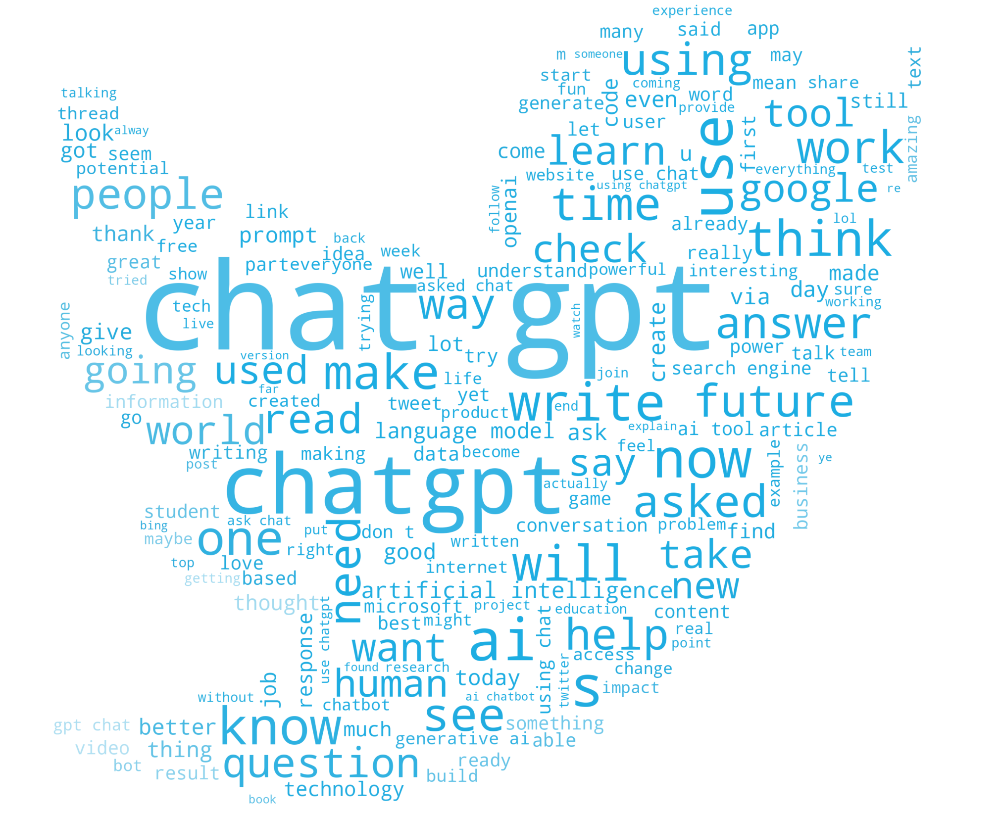

In [36]:
# Generate a word cloud image
mask = np.array(Image.open("/content/twitter_logo1.jpg"))
stopwords = set(STOPWORDS)

wordcloud_twitter = WordCloud(height=2000,
                              width=2000,
                              background_color="white",
                              mode="RGBA",
                              stopwords=stopwords,
                              mask=mask).generate(all_words_lem)

# Create coloring from the image
image_colors = ImageColorGenerator(mask)
plt.figure(figsize=[20,20])
plt.axis('off')
plt.tight_layout(pad=0)
plt.imshow(wordcloud_twitter.recolor(color_func=image_colors), interpolation="bilinear")

# Store visualization to file
plt.savefig("twitter_logo_unigram_words.png", format="png")

plt.show()

In [37]:
# Retrieves all occurrences of @+text
df['mentions'] = df['text'].str.findall(r'@\w+')
# Removes the @ in front
df['mentions'] = [list(map(lambda x: x[1:], mentions)) for mentions in df['mentions']]
# Converts the list of words in each row to a string
df['mentions_string'] = df['mentions'].apply(lambda x: ' '.join(x))
# Concatenates all strings in one string
all_mentions = ' '.join([word for word in df['mentions_string']])

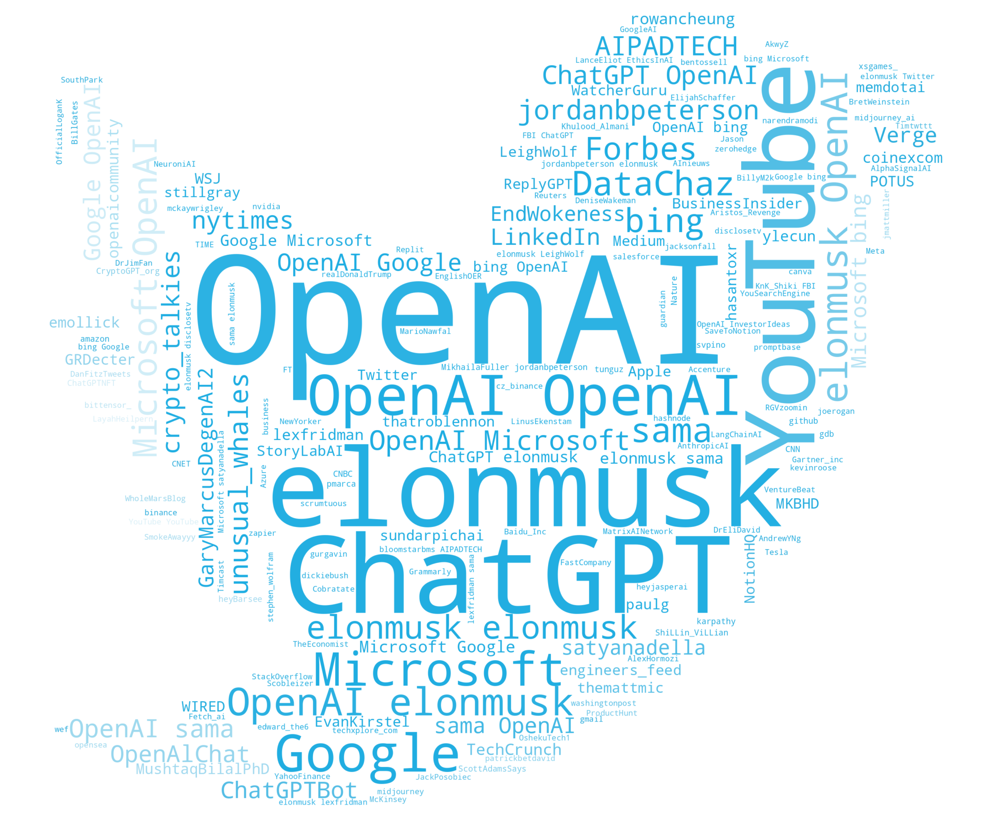

In [38]:
wordcloud_twitter = WordCloud(height=2000,
                              width=2000,
                              background_color="white",
                              mode="RGBA",
                              stopwords=stopwords,
                              mask=mask).generate(all_mentions)

# Create coloring from the image
image_colors = ImageColorGenerator(mask)
plt.figure(figsize=[20,20])
plt.axis('off')
plt.tight_layout(pad=0)
plt.imshow(wordcloud_twitter.recolor(color_func=image_colors), interpolation="bilinear")

# Store visualization to file
plt.savefig("twitter_logo_unigram_mentions.png", format="png")

plt.show()

In [39]:
# Retrieves all occurrences of #+text
df['hashtags'] = df['text'].str.findall(r'#\w+')
# Removes the @ in front
df['hashtags'] = [list(map(lambda x: x[1:], hashtags)) for hashtags in df['hashtags']]
# Converts the list of words in each row to a string
df['hashtags_string'] = df['hashtags'].apply(lambda x: ' '.join(x))
# Concatenates all strings in one string
all_hashtags = ' '.join([word for word in df['hashtags_string']])

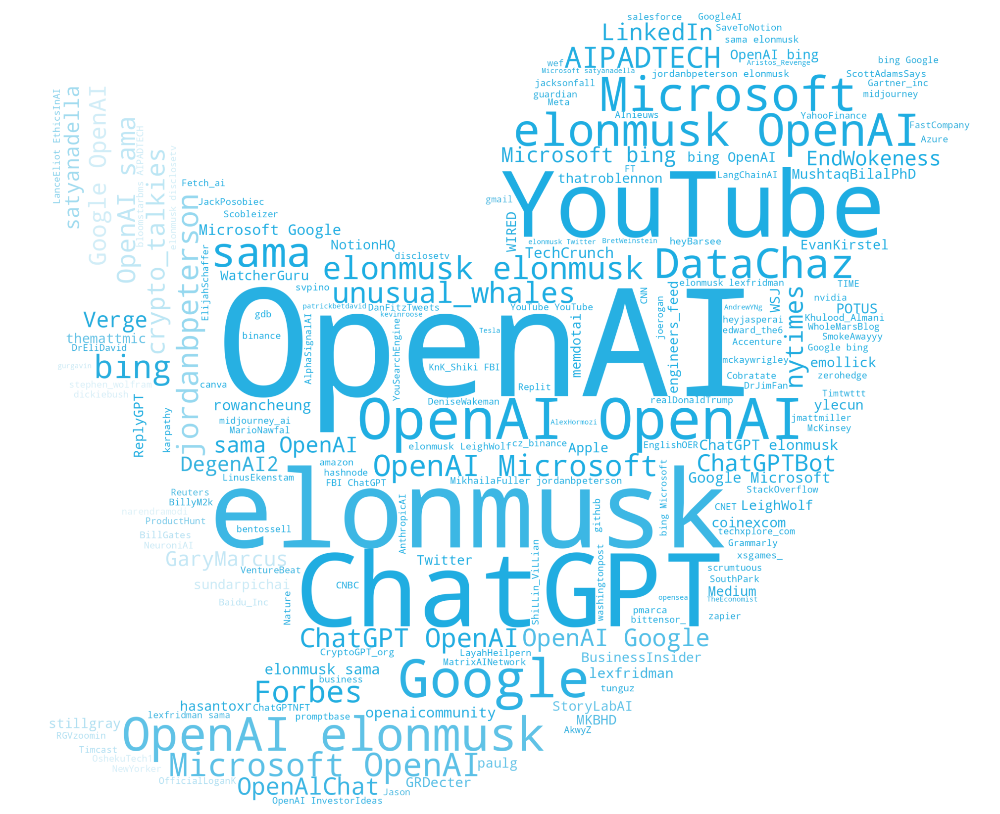

In [40]:
wordcloud_twitter = WordCloud(height=2000,
                              width=2000,
                              background_color="white",
                              mode="RGBA",
                              stopwords=stopwords,
                              mask=mask).generate(all_mentions)

# Create coloring from the image
image_colors = ImageColorGenerator(mask)
plt.figure(figsize=[20,20])
plt.axis('off')
plt.tight_layout(pad=0)
plt.imshow(wordcloud_twitter.recolor(color_func=image_colors), interpolation="bilinear")

# Store visualization to file
plt.savefig("twitter_logo_unigram_hashtags.png", format="png")

plt.show()

In [41]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

nltk.download('vader_lexicon')
sid = SentimentIntensityAnalyzer()

df['vader_polarity'] = df['processed_text'].map(
    lambda text: sid.polarity_scores(text)['compound']) 

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


In [42]:
from textblob import TextBlob

df['blob_polarity'] = df['processed_text'].map(
    lambda text: TextBlob(text).sentiment.polarity)

In [43]:
df.head(1)

,id,text,processed_text,text_lem,mentions,mentions_string,hashtags,hashtags_string,vader_polarity,blob_polarity
0,1641213230730051584,"Free AI marketing and automation tools, strate...","free ai marketing and automation tools, strate...","free ai marketing and automation tools, strate...",[],,[ChatGPT],ChatGPT,0.5106,0.268182


In [44]:
polarity_df = df[['vader_polarity', 'blob_polarity']]
polarity_df = polarity_df.rename(columns={'vader_polarity': 'Vader',
                                          'blob_polarity': 'TextBlob'})

fig = px.histogram(polarity_df, x=['Vader', 'TextBlob'], nbins=40, barmode='group', color_discrete_sequence=['#1DA1F2', '#EB8C17'])
fig.update_layout(title='Comparison of the distributions of sentimental polarities', xaxis_title='Polarity', yaxis_title='Count')
fig.show()

In [ ]:
def pre_process1(text):
    # Remove links
    text = re.sub('http://\S+|https://\S+', '', text)
    text = re.sub('http[s]?://\S+', '', text)
    text = re.sub(r"http\S+", "", text)

    text = re.sub('&amp', 'and', text)
    text = re.sub('&lt', '<', text)
    text = re.sub('&gt', '>', text)

    # Remove new line characters
    text = re.sub('[\r\n]+', ' ', text)

    # text = re.sub(r'@\w+', '', text)
    # text = re.sub(r'#\w+', '', text)
    text = re.sub(r'@\w+', lambda x: re.sub(r'[^a-zA-Z0-9\s]', '', x.group(0)), text)
    text = re.sub(r'#\w+', lambda x: re.sub(r'[^a-zA-Z0-9\s]', '', x.group(0)), text)

    # Remove multiple space characters
    text = re.sub('\s+',' ', text)
    
    # Convert to lowercase
    text = text.lower()
    return text

In [ ]:
df['processed_text_@_#'] = df['text'].apply(pre_process1)

In [ ]:
nltk.download('stopwords')
stop_words = nltk.corpus.stopwords.words('english')

def remove_stop_words(text):
    text = text.translate(str.maketrans('', '', string.punctuation))
    return ' '.join([word for word in text.split() if word.lower() not in stop_words])

df['stop_text'] = df['processed_text_@_#'].apply(lambda x: remove_stop_words(x))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
# We define a list of topics
topics = ['ai', 'gpt', 'chatgpt', 'chat gpt', 'elonmusk', 'openai','jordanbpeterson','lexfridman','mushtaqbilalphd', 'google', 'sama', 'microsoft' ,'youtube', 
'billgates', 'linkedin', 'bing', 'rowancheung', 'oneminutebrief', 'midjourney', 'jacksonfall']

In [ ]:
# We create a new column Topic
df['Topic'] = ""
for topic in topics:
    df.loc[df['stop_text'].str.contains(topic), 'Topic'] = topic

# We create a new DataFrame with columns topic / sentiment / source
data = []
for topic in topics:
    topic_rows = df[df['Topic'] == topic]
    # Average sentiment per topic
    vader_sentiments = topic_rows['vader_polarity'].sum() / topic_rows.shape[0]
    textblob_sentiments = topic_rows['blob_polarity'].sum() / topic_rows.shape[0]
    # Append data
    data.append({'Topic': topic, 'Sentiment': vader_sentiments, 'Source': 'Vader'})
    data.append({'Topic': topic, 'Sentiment': textblob_sentiments, 'Source': 'TextBlob'})

df_new = pd.DataFrame(data)

In [ ]:
# Plot the sentiment for each topic
fig = px.bar(df_new,
             x='Topic',
             y='Sentiment',
             color='Source',
             barmode='group',
             color_discrete_sequence = ['#1DA1F2', '#EB8C17'],
             title='Comparative sentimental analysis by topic',
             template='plotly_white')

fig.update_traces(marker_line_width=1,
                  marker_line_color="black")

fig.show()

In [ ]:
usernames = ['@elonmusk', '@OpenAI', '@lexfridman','@MushtaqBilalPhD', '@bing', '@Google', '@jacksonfall' , '@rowancheung', '@sama', '@Accenture', '@crypto_talkies', '@BillGates', '@Microsoft', '@nytimes', '@LinkedIn', '@Forbes', '@Apple']
vader_sentiments = df['vader_polarity'].tolist()
textblob_sentiments = df['blob_polarity'].tolist()
text = df['text'].tolist()

# create a new column for the username
df['Mention'] = ""
for username in usernames:
    df.loc[df['text'].str.contains(username), 'Mention'] = username

# create a new dataframe with columns for username, sentiment, and sentiment source
data = []
for username in usernames:
    username_rows = df[df['Mention'] == username]
    vader_sentiments = username_rows['vader_polarity'].sum() / username_rows.shape[0]
    textblob_sentiments = username_rows['blob_polarity'].sum() / username_rows.shape[0]
    data.append({'Mention': username, 'Sentiment': vader_sentiments, 'Source': 'Vader'})
    data.append({'Mention': username, 'Sentiment': textblob_sentiments, 'Source': 'TextBlob'})
df_new = pd.DataFrame(data)

# plot the sentiment for each username using Plotly
fig = px.bar(df_new,
             x='Mention',
             y='Sentiment',
             color='Source',
             barmode='group',
             color_discrete_sequence = ['#1DA1F2', '#EB8C17'],
             title='Comparative sentimental analysis by accounts',
             template='plotly_white')

fig.update_traces(marker_line_width=1,
                  marker_line_color="black")

fig.show()